# 08. PyTorch Paper Replication

In this project, we're going to replicate a ML research paper and creating a Vision Transformer (ViT) from scratch using PyTorch.


The goal of paper replicating is to replicate the ML advances with code so that the techniques can be used for our own problem.

Contents of a machine learning research paper can vary from paper to paper but they generally follow this structure

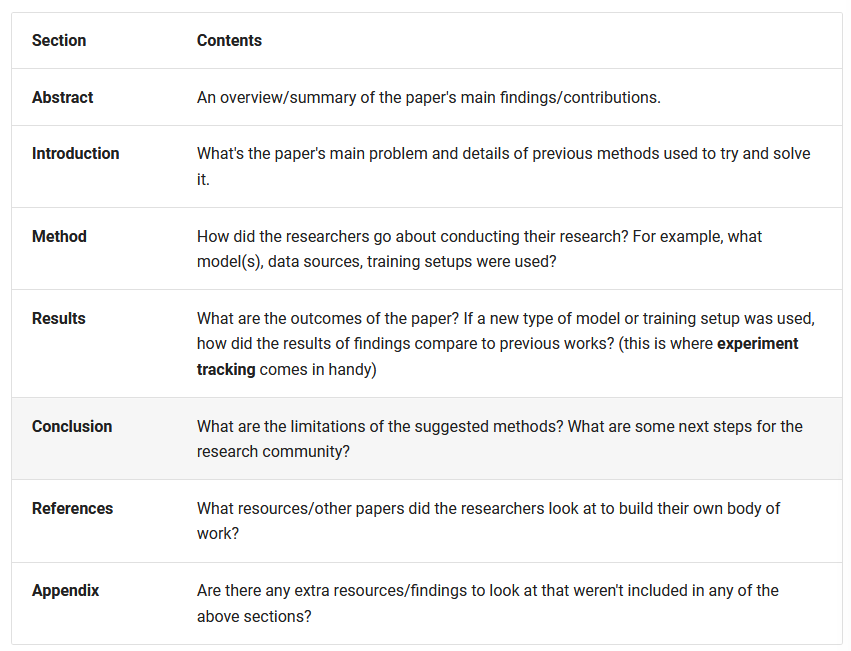

## Places to find code examples of ML research papers.

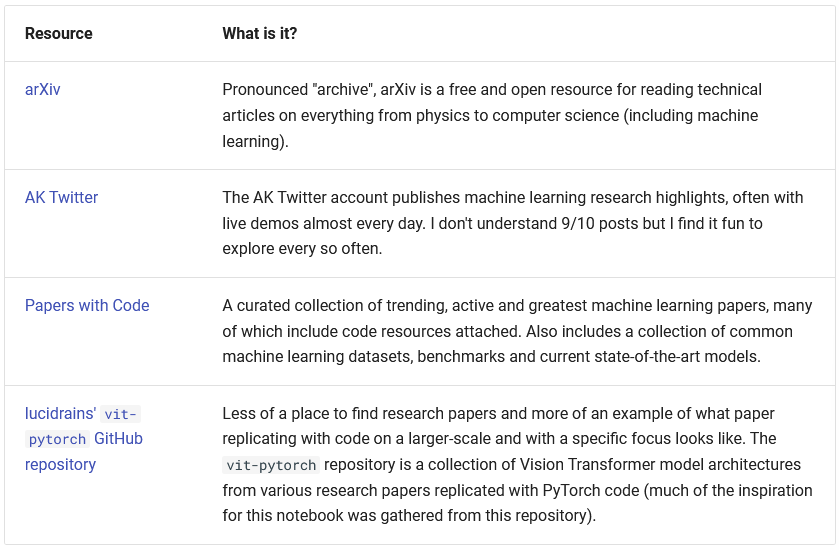

we're going to be replicating the machine learning research paper An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale (https://arxiv.org/abs/2010.11929) with PyTorch

The Transformer neural network architecture was originally introduces in the machine learning research paper Attention is all you need (https://arxiv.org/abs/1706.03762).

Original Transformer Architecutre was designed to work on 1D sequence of text.

A transformer architecture is generally considered to be any neural network that uses the attention mechanism as its primary learning layer. Similar to how a convolutional neural network uses convolutions as its primary learning layer.



The Vision transformer (ViT) architecture was designed to adapt the original transformer architecture to vision problem(s) (classification being the first and since then many others have followed).


We will replicate the first Vision transformer architecture (the orignial).

## 0. Getting setup

import modules and libraries

In [2]:
import torch
from torch import nn
import torchvision
from torchvision import transforms
from torchinfo import summary
import matplotlib.pyplot as plt

from going_modular.going_modular import data_setup, engine
from helper_functions import download_data, set_seeds, plot_loss_curves

c:\Users\Anubhav\miniconda3\envs\nn\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# set device

device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## 1. Get the data

In [4]:
# Download pizza, steak, sushi images from GitHub
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] data\pizza_steak_sushi directory exists, skipping download.


WindowsPath('data/pizza_steak_sushi')

In [5]:
train_dir = image_path/ "train"
test_dir = image_path / "test"

## 2. Create Datasets and DataLoaders

now that we have data lets turn it into `DataLoader`'s.

In table 3, of paper the training res (img size) is mentioned as 224 (h,w)

### 2.1 Prepare transform for images

In [6]:
# hyper param for img size
IMG_SIZE = 224

manual_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])

print(f"The Manual transform: {manual_transforms}")

The Manual transform: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
)


### 2.2 Turn images into `DataLoader`'s

The paper states the use of a batch size of 4096 which is 128x the size of what we used in past.

lets stick with 32 since 4096 is significantly large

In [7]:
BATCH_SIZE = 32 # hyper param 

train_dataloader , test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir= train_dir, 
    test_dir = test_dir,
    transform= manual_transforms,
    batch_size= BATCH_SIZE,
    num_workers= 0
)

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x15dc9fe5ed0>,
 ['pizza', 'steak', 'sushi'])

### 2.3 Visualize a single image

Lets look at 1 image from dataset (important because we are going to have to make patches from what we have seen in the paper)

In [8]:
image_batch , label_batch = next(iter(train_dataloader))

image, label = image_batch[0], label_batch[0]

image.shape, label

(torch.Size([3, 224, 224]), tensor(0))

(-0.5, 223.5, 223.5, -0.5)

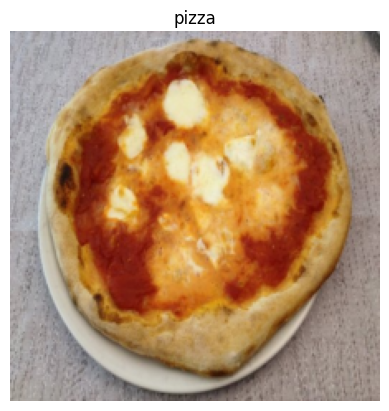

In [9]:
plt.imshow(image.permute(1,2,0))
plt.title(class_names[label])
plt.axis(False)

## 3. Replicating the ViT paper: an overview


### 3.1 Inputs and outputs, layers and blocks

* Layer - takes an input, performs a function on it, returns an output.

* Block - a collection of layers, takes and input, performs a series of function on it, returns an output.

* Architecture (or model) - a collection of blocks, takes an input, performs a series of functions on it, returns an output.




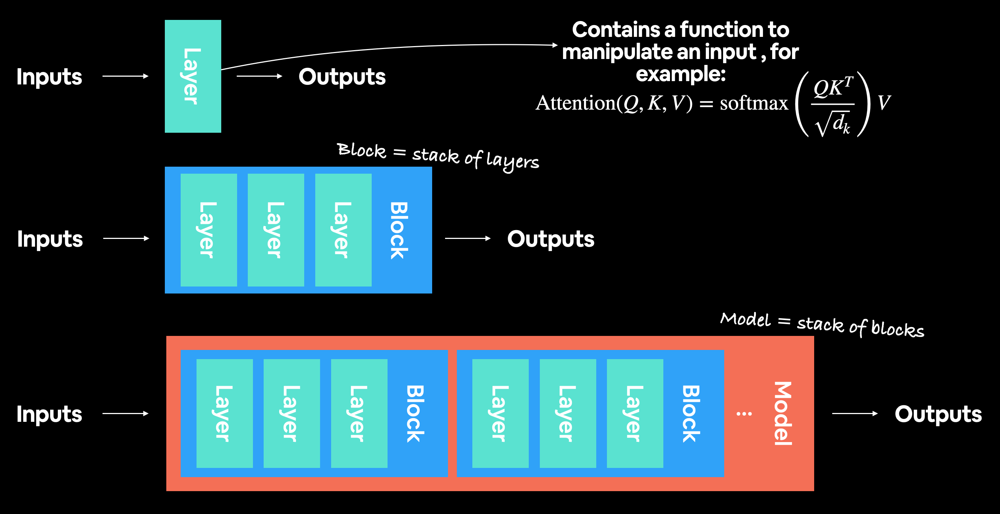

### 3.2 What's ViT made of?

1. Figure - This gives an overview of the model in a graphical sense, you could almost recreate the architecture with this figure alone.

2. Four Equations in section 3.1 - These equations give a little bit more of a mathematical grounding to the color block in fig 1.

3. Table 1 - This table shows this various hyperparameter settings (no of layers and no of hidden units) for ViT model variants. We'll be focused on the smallest version, ViT - Base.

#### 3.2.1 Exploring Figure 1

1. **Layers**- takes an input, performs an operation or function on the input, produces an output.
2. **Blocks**- a collection of layers, which in turn also takes an input and produces and output.
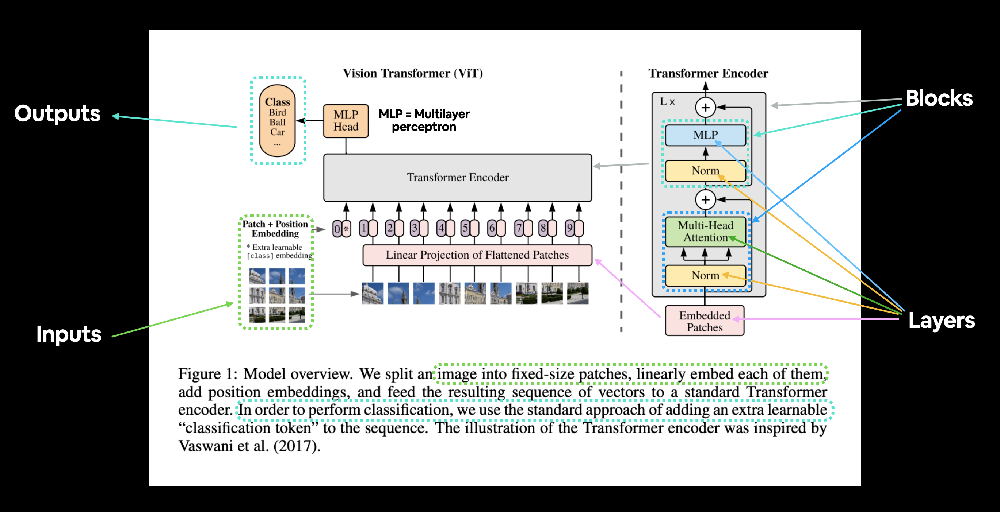


The ViT architecture is comprised of several stages:

* **Patch + Position Embedding(input)** - turns the input image into a sequence of image patches and adds a position number to specify in what order the patch comes in.

* **Linear Projection of flattened patches (Embedded Patches)**- The image patches get turned into an embedding, the benefit of using an embedding rather than just the image values is that an embedding is a learnable representation (typically in the form of a vector) of the image that can improve with training.

* **Norm**- This is short for "Layer Normalization" or "LayerNorm", a technique for regularizing (reducing overfitting) a neural network, you can use LayerNorm via the PyTorch layer `torch.nn.LayerNorm()`.

* **Multi-Head Attention** - This is a Multi-Headed Self-Attention layer or "MSA" for short. You can create an MSA layer via the PyTorch layer torch.nn.MultiheadAttention().

* **MLP (or Multilayer perceptron)** - A MLP can often refer to any collection of feedforward layers (or in PyTorch's case, a collection of layers with a forward() method). In the ViT Paper, the authors refer to the MLP as "MLP block" and it contains two torch.nn.Linear() layers with a torch.nn.GELU() non-linearity activation in between them (section 3.1) and a torch.nn.Dropout() layer after each (Appendix B.1).

* **Transformer Encoder** - The Transformer Encoder, is a collection of the layers listed above. There are two skip connections inside the Transformer encoder (the "+" symbols) meaning the layer's inputs are fed directly to immediate layers as well as subsequent layers. The overall ViT architecture is comprised of a number of Transformer encoders stacked on top of eachother.

* **MLP Head** - This is the output layer of the architecture, it converts the learned features of an input to a class output. Since we're working on image classification, you could also call this the "classifier head". The structure of the MLP Head is similar to the MLP block.

#### 3.2.1 Equation 1 overview


$$ \begin{aligned} \mathbf{z}_{0} &=\left[\mathbf{x}_{\text {class }} ; \mathbf{x}_{p}^{1} \mathbf{E} ; \mathbf{x}_{p}^{2} \mathbf{E} ; \cdots ; \mathbf{x}_{p}^{N} \mathbf{E}\right]+\mathbf{E}_{\text {pos }}, & & \mathbf{E} \in \mathbb{R}^{\left(P^{2} \cdot C\right) \times D}, \mathbf{E}_{\text {pos }} \in \mathbb{R}^{(N+1) \times D} \end{aligned} $$

This equation deals with the class token, patch embedding and position embedding ($\mathbf{E}$ is for embedding) of the input image.

In vector form, the embedding might look something like:

x_input = [class_token, image_patch_1, image_patch_2, image_patch_3...] + [class_token_position, image_patch_1_position, image_patch_2_position, image_patch_3_position...]

Where each of the elements in the vector is learnable (their requires_grad=True).

#### 3.2.2 Equation 2 overview

$$ \begin{aligned} \mathbf{z}_{\ell}^{\prime} &=\operatorname{MSA}\left(\operatorname{LN}\left(\mathbf{z}_{\ell-1}\right)\right)+\mathbf{z}_{\ell-1}, & & \ell=1 \ldots L \end{aligned} $$

This says that for every layer from $1$ through to $L$ (the total number of layers), there's a Multi-Head Attention layer (MSA) wrapping a LayerNorm layer (LN).

The addition on the end is the equivalent of adding the input to the output and forming a skip/residual connection.

We'll call this layer the "MSA block".

In pseudocode, this might look like:

x_output_MSA_block = MSA_layer(LN_layer(x_input)) + x_input

Notice the skip connection on the end (adding the input of the layers to the output of the layers).

#### 3.2.2 Equation 3 overview


$$ \begin{aligned} \mathbf{z}_{\ell} &=\operatorname{MLP}\left(\operatorname{LN}\left(\mathbf{z}_{\ell}^{\prime}\right)\right)+\mathbf{z}_{\ell}^{\prime}, & & \ell=1 \ldots L \\ \end{aligned} $$

This says that for every layer from $1$ through to $L$ (the total number of layers), there's also a Multilayer Perceptron layer (MLP) wrapping a LayerNorm layer (LN).

The addition on the end is showing the presence of a skip/residual connection.

We'll call this layer the "MLP block".

In pseudocode, this might look like:

x_output_MLP_block = MLP_layer(LN_layer(x_output_MSA_block)) + x_output_MSA_block

Notice the skip connection on the end (adding the input of the layers to the output of the layers).

#### 3.2.2 Equation 4 overview

$$ \begin{aligned} \mathbf{y} &=\operatorname{LN}\left(\mathbf{z}_{L}^{0}\right) & & \end{aligned} $$

This says for the last layer $L$, the output $y$ is the 0 index token of $z$ wrapped in a LayerNorm layer (LN).

Or in our case, the 0 index of x_output_MLP_block:

y = Linear_layer(LN_layer(x_output_MLP_block[0]))

Of course there are some simplifications above but we'll take care of those when we start to write PyTorch code for each section.

## 4. Equation 1 --- Splitting and embedding the patches.


*    $D$ is the size of the patch embeddings, different values for $D$ for various sized ViT models can be found in Table 1.
*    The image starts as 2D with size ${H \times W \times C}$.
     *   $(H, W)$ is the resolution of the original image (height, width).
      *  $C$ is the number of channels.
 *   The image gets converted to a sequence of flattened 2D patches with size ${N \times\left(P^{2} \cdot C\right)}$.
      *  $(P, P)$ is the resolution of each image patch (patch size).
      *  $N=H W / P^{2}$ is the resulting number of patches, which also serves as the input sequence length for the Transformer.


For 16 (ViT base) the patch size is 16.

### 4.1 calculating embedded input output shape

In [10]:
# Calculate the number of patches
height = 224
width = 224
color_channels = 3
patch_size = 16

n = (height * width)/ (patch_size)**2
n = int(n)

print(f"The number of patches we get is : {n}")

The number of patches we get is : 196


In [11]:
print(f"The Embedded output is: {n, (patch_size**2)*color_channels}")

The Embedded output is: (196, 768)


### 4.2 turn single image into patches


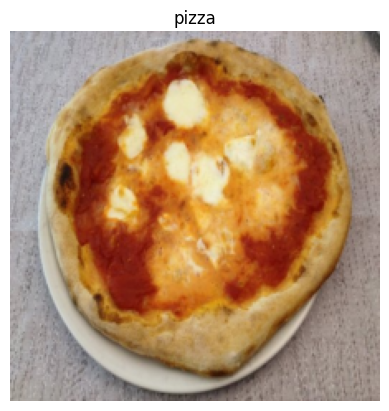

In [12]:
# View single image
plt.imshow(image.permute(1, 2, 0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False);

(-0.5, 223.5, 15.5, -0.5)

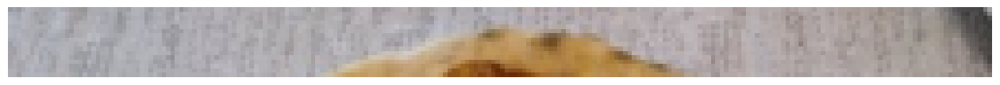

In [13]:
image_permuted = image.permute(1,2,0) # to make compatible with matplotlib

patch_size = 16

plt.figure(figsize=(patch_size, patch_size))
plt.imshow(image_permuted[:patch_size, :, :]);
plt.axis(False)

No. of Patches per row: 14.0
Patch Size: 16 pixels x 16 pixels


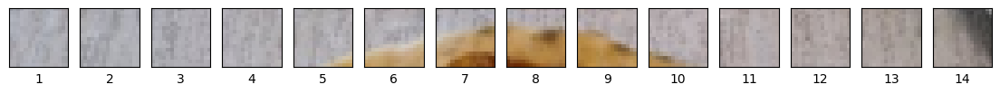

In [14]:
# Setup hyper params + make sure patch size matches with img size
img_size = 224
patch_size = 16
num_patch = img_size/patch_size

assert img_size % patch_size == 0, "Improper image size please fix"
print(f"No. of Patches per row: {num_patch}\nPatch Size: {patch_size} pixels x {patch_size} pixels")

fig, axs = plt.subplots(nrows = 1,
                       ncols = img_size // patch_size,
                       figsize = (num_patch, num_patch),
                       sharex = True,
                       sharey = True)

for i, patch in enumerate(range(0, img_size, patch_size)):
    axs[i].imshow(image_permuted[:patch_size, patch : patch+patch_size, :]);
    axs[i].set_xlabel(i+1)
    axs[i].set_xticks([])
    axs[i].set_yticks([])

No. of Patches per row: 14.0
Patch Size: 16 pixels x 16 pixels


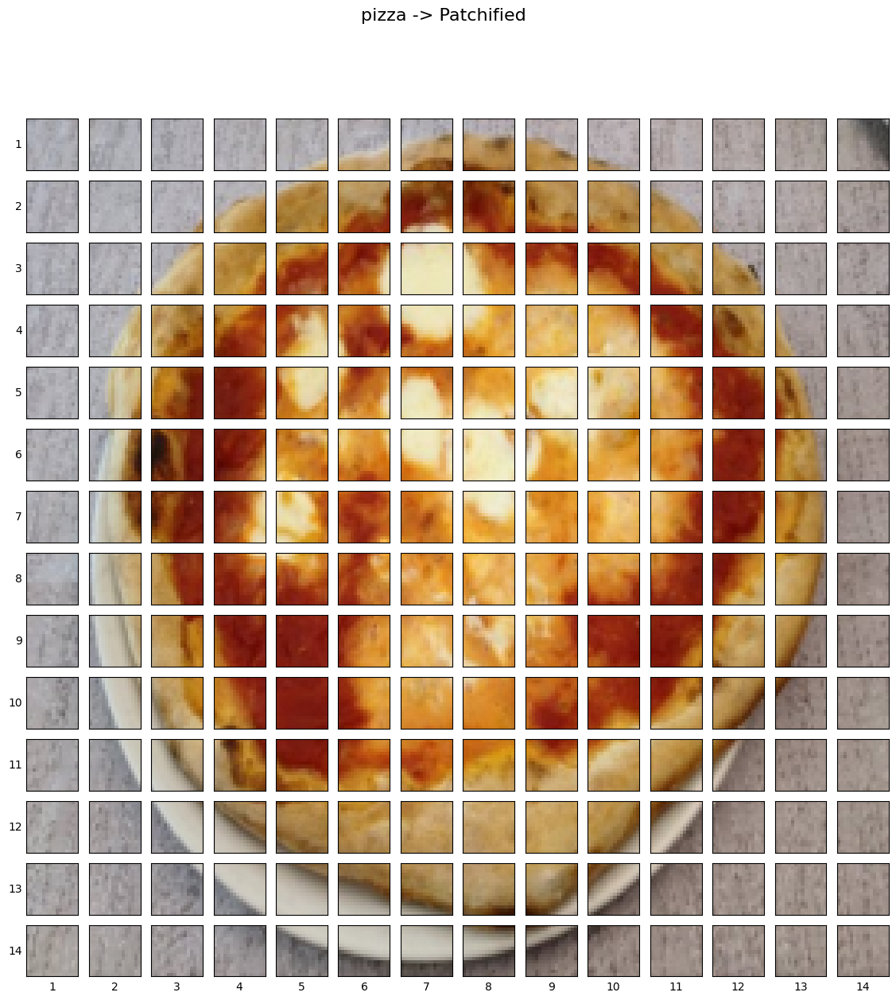

In [15]:
# Setup hyper params + make sure patch size matches with img size
img_size = 224
patch_size = 16
num_patch = img_size/patch_size

assert img_size % patch_size == 0, "Improper image size please fix"
print(f"No. of Patches per row: {num_patch}\nPatch Size: {patch_size} pixels x {patch_size} pixels")

fig, axs = plt.subplots(nrows = img_size // patch_size,
                       ncols = img_size // patch_size,
                       figsize = (num_patch, num_patch),
                       sharex = True,
                       sharey = True)

for i, patch_height in enumerate(range(0, img_size, patch_size)):
    for j, patch_width in enumerate(range(0,img_size,patch_size)):
        axs[i,j].imshow(image_permuted[patch_height: patch_height+patch_size,  # iterates through the height
                                       patch_width : patch_width + patch_size, # iterates through the width
                                       :]); # get all color channels
        axs[i,j].set_ylabel(i+1,
                            rotation = "horizontal",
                            horizontalalignment = "right",
                            verticalalignment = "center")
        axs[i,j].set_xlabel(j+1)
        axs[i,j].set_xticks([])
        axs[i,j].set_yticks([])
        axs[i,j].label_outer()

# 1 title
fig.suptitle(f"{class_names[label]} -> Patchified", fontsize = 16)
plt.show()

### 4.3 Creating patches using `torch.nn.conv2d()`

We've seen what an image looks like when it gets turned into patches, but this way is very hectic.

let's start moving towards replicating the patch embedding layer with PyTorch.

the authors of the ViT paper mention that the patch embedding is achievable with a convolutional neural network(CNN):

by setting the `kernel_size` and `stride` parameters of a `torch.nn.Conv2d()` layer equal to the patch_size, we can effectively get a layer that splits our image into patches and creates a learnable embedding (referred to as a "Linear Projection" in the ViT paper) of each patch.

* input - (224,224,3)
* output - (196, 768)

In [16]:
from torch import nn

patch_size = 16 

conv2d = nn.Conv2d(3,
                   768,
                   patch_size,
                   patch_size,
                   padding= 0)

In [17]:
image_out_of_conv = conv2d(image.unsqueeze(0)) # add 1 single batch
print(image_out_of_conv.shape)

torch.Size([1, 768, 14, 14])


let's visualize five random feature maps and see what they look like.

Showing random convolutional feature maps from indexes: [755, 8, 372, 446, 219]


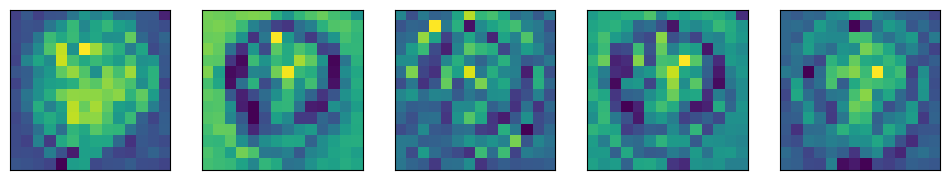

In [18]:
# Plot random 5 convolutional feature maps
import random
random_indexes = random.sample(range(0, 758), k=5) # pick 5 numbers between 0 and the embedding size
print(f"Showing random convolutional feature maps from indexes: {random_indexes}")

# Create plot
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(12, 12))

# Plot random image feature maps
for i, idx in enumerate(random_indexes):
    image_conv_feature_map = image_out_of_conv[:, idx, :, :] # index on the output tensor of the convolutional layer
    axs[i].imshow(image_conv_feature_map.squeeze().detach().numpy())
    axs[i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[]);




these are the features layer has learned and a key point here is that they may change over time as our nn learns

this means it can be considered a learnable embedding of our image

In [19]:
# Get a single feature map in tensor form
single_feature_map = image_out_of_conv[:, 0, :, :]
single_feature_map, single_feature_map.requires_grad

(tensor([[[ 1.2609e-03, -4.7793e-02,  1.1465e-02, -1.4271e-02,  8.0977e-05,
            5.3380e-02,  1.4055e-01,  1.2756e-01,  5.6212e-02,  9.8024e-03,
           -8.1179e-03,  3.1585e-02, -1.6298e-02, -4.2514e-02],
          [-2.5774e-03, -2.4314e-02,  5.4258e-02,  1.4908e-01,  6.7057e-02,
            1.4366e-01, -8.8583e-02,  4.1402e-02,  6.2932e-02,  5.1999e-02,
            1.0863e-01,  8.5442e-03,  9.6457e-03,  5.6473e-03],
          [ 2.4351e-02,  4.8359e-03,  9.3676e-02,  1.0099e-01,  1.5726e-02,
           -1.0942e-01,  3.6535e-02, -9.6813e-03, -6.2678e-02,  5.8480e-02,
            7.4529e-02,  1.2838e-01,  2.1545e-02,  5.3853e-04],
          [-1.1103e-03,  3.2900e-02,  1.5203e-01,  6.3677e-02, -9.4376e-02,
            8.4292e-02,  1.3530e-01,  7.0516e-02,  5.7682e-02,  1.8925e-02,
            6.7337e-02, -2.3988e-02,  4.0615e-02,  5.2466e-03],
          [-5.4225e-03,  8.1180e-02,  8.4846e-02, -3.2566e-02,  1.5298e-01,
           -1.0054e-01, -1.8955e-02, -1.4861e-02,  3.8854e-0

the `grad_fn` output of the `single_feature_map` and the `requires_grad = True` attribute means PyTorch is tracking the gradients of this feature map and it will be updated by gradient descent during training.

### 4.4 Flattening the patch embedding

* desired output: (196, 768) -> (num of patches, embedding dimention) ->  ${N \times\left(P^{2} \cdot C\right)}$

In [20]:
image_out_of_conv.shape

torch.Size([1, 768, 14, 14])

In [21]:
# create flatten layer 
flatten = nn.Flatten(start_dim=2, # flatten feature map height
                     end_dim= 3) # flatten feature map width


Original image shape: torch.Size([3, 224, 224])
Image feature map shape: torch.Size([1, 768, 14, 14])
Flattened image feature map shape: torch.Size([1, 768, 196])


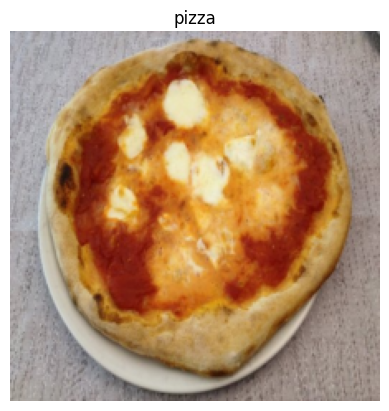

In [22]:
plt.imshow(image.permute(1,2,0))
plt.title(class_names[label])
plt.axis(False)
print(f"Original image shape: {image.shape}")


image_out_of_conv = conv2d(image.unsqueeze(0))
print(f"Image feature map shape: {image_out_of_conv.shape}")

image_out_of_conv_flattened = flatten(image_out_of_conv)
print(f"Flattened image feature map shape: {image_out_of_conv_flattened.shape}")

(-0.5, 195.5, 0.5, -0.5)

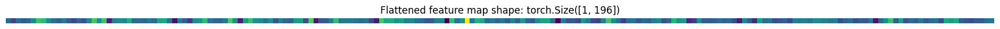

In [23]:
image_out_of_conv_flattened_reshaped = image_out_of_conv_flattened.permute(0,2,1)
single_flattened_feature_map = image_out_of_conv_flattened_reshaped[:,:,0]

plt.figure(figsize=(22,22))
plt.imshow(single_flattened_feature_map.detach().numpy())
plt.title(f"Flattened feature map shape: {single_flattened_feature_map.shape}")
plt.axis(False)

In [24]:
single_flattened_feature_map, single_flattened_feature_map.requires_grad, single_flattened_feature_map.shape

(tensor([[ 1.2609e-03, -4.7793e-02,  1.1465e-02, -1.4271e-02,  8.0977e-05,
           5.3380e-02,  1.4055e-01,  1.2756e-01,  5.6212e-02,  9.8024e-03,
          -8.1179e-03,  3.1585e-02, -1.6298e-02, -4.2514e-02, -2.5774e-03,
          -2.4314e-02,  5.4258e-02,  1.4908e-01,  6.7057e-02,  1.4366e-01,
          -8.8583e-02,  4.1402e-02,  6.2932e-02,  5.1999e-02,  1.0863e-01,
           8.5442e-03,  9.6457e-03,  5.6473e-03,  2.4351e-02,  4.8359e-03,
           9.3676e-02,  1.0099e-01,  1.5726e-02, -1.0942e-01,  3.6535e-02,
          -9.6813e-03, -6.2678e-02,  5.8480e-02,  7.4529e-02,  1.2838e-01,
           2.1545e-02,  5.3853e-04, -1.1103e-03,  3.2900e-02,  1.5203e-01,
           6.3677e-02, -9.4376e-02,  8.4292e-02,  1.3530e-01,  7.0516e-02,
           5.7682e-02,  1.8925e-02,  6.7337e-02, -2.3988e-02,  4.0615e-02,
           5.2466e-03, -5.4225e-03,  8.1180e-02,  8.4846e-02, -3.2566e-02,
           1.5298e-01, -1.0054e-01, -1.8955e-02, -1.4861e-02,  3.8854e-02,
           1.3355e-01,  2

### 4.5 Turning the ViT patch embedding layer into a PyTorch module


now we combine everything into a pytorch module

Specifically we'll:

1. Create a class that subclass nn.module
2. initialize with params `in_channels = 3`, `patch_size=16` and `embedding_dim=768`
3. Create a layer to turn image into patches using `nn.Conv2d()`
4. Create a layer to flatten the patch feature map into 1 dimension
5. define `forward()` to take an input and pass it through the layers.
6. Make sure output reflect output shape in the ViT architecture.

In [25]:
class PatchEmbedding(nn.Module):

    def __init__(self, 
                 in_channels: int = 3,
                 patch_size: int = 16,
                 embedding_dim: int = 768) -> None:
        super().__init__()

        self.patcher = nn.Conv2d(in_channels= in_channels,
                                 out_channels=embedding_dim,
                                 kernel_size=patch_size,
                                 stride=patch_size,
                                 padding=0)
        
        self.flatten = nn.Flatten(start_dim= 2, 
                                  end_dim= 3)
        

    def forward(self, x):

        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size not compatible ({image_resolution})"


        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)

        return x_flattened.permute(0,2,1)

In [26]:
set_seeds()

patchify = PatchEmbedding(in_channels = 3,
                          patch_size= 16,
                          embedding_dim= 768)

print(f"Input image shape: {image.unsqueeze(0).shape}")

patch_embedded_image = patchify(image.unsqueeze(0))

print(f"Output patch embedding shape: {patch_embedded_image.shape}")

Input image shape: torch.Size([1, 3, 224, 224])
Output patch embedding shape: torch.Size([1, 196, 768])


In [27]:
# Create random input sizes
random_input_image = (1, 3, 224, 224)
random_input_image_error = (1, 3, 250, 250) # will error because image size is incompatible with patch_size

# Get a summary of the input and outputs of PatchEmbedding (uncomment for full output)
summary(PatchEmbedding(),
        input_size=random_input_image, # try swapping this for "random_input_image_error"
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
PatchEmbedding (PatchEmbedding)          [1, 3, 224, 224]     [1, 196, 768]        --                   True
├─Conv2d (patcher)                       [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Flatten (flatten)                      [1, 768, 14, 14]     [1, 768, 196]        --                   --
Total params: 590,592
Trainable params: 590,592
Non-trainable params: 0
Total mult-adds (M): 115.76
Input size (MB): 0.60
Forward/backward pass size (MB): 1.20
Params size (MB): 2.36
Estimated Total Size (MB): 4.17

### 4.6 Creating the class token embedding



In [28]:
# Get the batch size and embedding dimension
batch_size = patch_embedded_image.shape[0]
embedding_dimension = patch_embedded_image.shape[-1]

# Create the class token embedding as a learnable parameter that shares the same size as the embedding dimension (D)
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension), # [batch_size, number_of_tokens, embedding_dimension]
                           requires_grad=True) # make sure the embedding is learnable

# Show the first 10 examples of the class_token
print(class_token[:, :, :10])

# Print the class_token shape
print(f"Class token shape: {class_token.shape} -> [batch_size, number_of_tokens, embedding_dimension]")

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)
Class token shape: torch.Size([1, 1, 768]) -> [batch_size, number_of_tokens, embedding_dimension]


In [29]:
# Add the class token embedding to the front of the patch embedding
patch_embedded_image_with_class_embedding = torch.cat((class_token, patch_embedded_image),
                                                      dim=1) # concat on first dimension

# Print the sequence of patch embeddings with the prepended class token embedding
print(patch_embedded_image_with_class_embedding)
print(f"Sequence of patch embeddings with class token prepended shape: {patch_embedded_image_with_class_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [-0.7227,  0.1758, -0.2007,  ...,  0.5517, -0.2952,  0.2122],
         [-0.7285,  0.1819, -0.2139,  ...,  0.5245, -0.3214,  0.2530],
         ...,
         [-0.6098,  0.1755, -0.1632,  ...,  0.4697, -0.2659,  0.1960],
         [-0.6276,  0.2052, -0.1449,  ...,  0.4165, -0.3079,  0.2544],
         [-0.6270,  0.1462, -0.1249,  ...,  0.4438, -0.3175,  0.1814]]],
       grad_fn=<CatBackward0>)
Sequence of patch embeddings with class token prepended shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


### 4.7 Creating the position embedding

this helps the architecture know which patch comes before and after a particular patch

In [30]:
# View the sequence of patch embeddings with the prepended class embedding
patch_embedded_image_with_class_embedding, patch_embedded_image_with_class_embedding.shape

(tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
          [-0.7227,  0.1758, -0.2007,  ...,  0.5517, -0.2952,  0.2122],
          [-0.7285,  0.1819, -0.2139,  ...,  0.5245, -0.3214,  0.2530],
          ...,
          [-0.6098,  0.1755, -0.1632,  ...,  0.4697, -0.2659,  0.1960],
          [-0.6276,  0.2052, -0.1449,  ...,  0.4165, -0.3079,  0.2544],
          [-0.6270,  0.1462, -0.1249,  ...,  0.4438, -0.3175,  0.1814]]],
        grad_fn=<CatBackward0>),
 torch.Size([1, 197, 768]))

Equation 1 states that the position embeddings ($\mathbf{E}_{\text {pos }}$) should have the shape $(N + 1) \times D$:

$$\mathbf{E}_{\text {pos }} \in \mathbb{R}^{(N+1) \times D}$$

Where:

*    $N=H W / P^{2}$ is the resulting number of patches, which also serves as the effective input sequence length for the Transformer (number of patches).
*    $D$ is the size of the patch embeddings, different values for $D$ can be found in Table 1 (embedding dimension).


In [31]:
# Calculate N (number of patches)
number_of_patches = int((height * width) / patch_size**2)

# Get embedding dimension
embedding_dimension = patch_embedded_image_with_class_embedding.shape[2]

# Create the learnable 1D position embedding
position_embedding = nn.Parameter(torch.ones(1,
                                             number_of_patches+1,
                                             embedding_dimension),
                                  requires_grad=True) # make sure it's learnable

# Show the first 10 sequences and 10 position embedding values and check the shape of the position embedding
print(position_embedding[:, :10, :10])
print(f"Position embedding shape: {position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)
Position embedding shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [32]:
# Add the position embedding to the patch and class token embedding
patch_and_position_embedding = patch_embedded_image_with_class_embedding + position_embedding
print(patch_and_position_embedding)
print(f"Patch embeddings, class token prepended and positional embeddings added shape: {patch_and_position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[2.0000, 2.0000, 2.0000,  ..., 2.0000, 2.0000, 2.0000],
         [0.2773, 1.1758, 0.7993,  ..., 1.5517, 0.7048, 1.2122],
         [0.2715, 1.1819, 0.7861,  ..., 1.5245, 0.6786, 1.2530],
         ...,
         [0.3902, 1.1755, 0.8368,  ..., 1.4697, 0.7341, 1.1960],
         [0.3724, 1.2052, 0.8551,  ..., 1.4165, 0.6921, 1.2544],
         [0.3730, 1.1462, 0.8751,  ..., 1.4438, 0.6825, 1.1814]]],
       grad_fn=<AddBackward0>)
Patch embeddings, class token prepended and positional embeddings added shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


### 4.8 putting it all together

replicating equation 1 from section 3.1 of the ViT paper:

$$ \begin{aligned} \mathbf{z}_{0} &=\left[\mathbf{x}_{\text {class }} ; \mathbf{x}_{p}^{1} \mathbf{E} ; \mathbf{x}_{p}^{2} \mathbf{E} ; \cdots ; \mathbf{x}_{p}^{N} \mathbf{E}\right]+\mathbf{E}_{\text {pos }}, & & \mathbf{E} \in \mathbb{R}^{\left(P^{2} \cdot C\right) \times D}, \mathbf{E}_{\text {pos }} \in \mathbb{R}^{(N+1) \times D} \end{aligned} $$


we can do so by:

1. Setting patch size
2. Getting single image, saving its h and w
3. adding batch so its compatible with our `PatchEmbedding` layer.
4. creating 1 instance of layer with in = 3, and out = 768
5. pass single image to layer to get patches.
6. Create class token 
7. prepending to patches.
8. creating position embedding
9. Adding position embedding to class token and patch embeddings.



In [33]:
set_seeds()
# 1. set patch size
patch_size = 16
# 2. store h , w
print(f"Image tensor shape: {image.shape}")
height , width = image.shape[1], image.shape[2]
# add batch data
x = image.unsqueeze(0)
print(f"Input image with batch dimension shape: {x.shape}")

# create instance of layer
patch_embedding_layer = PatchEmbedding(in_channels= 3,
                                       patch_size= patch_size,
                                       embedding_dim=768)

# pass image through the layer
patch_embedding = patch_embedding_layer(x)

print(f"Embedding shape: {patch_embedding.shape}")

# create class token
batch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]

class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad= True)

# prepend class to patch embedding

patch_embedding_class_token = torch.cat((class_token, patch_embedding), dim = 1)

# creating position embedding
number_of_patches = int((height*width)/ patch_size**2)
position_embedding = nn.Parameter(torch.ones(1,number_of_patches+1,embedding_dimension),
                                  requires_grad= True)

patch_and_position_embedding = patch_embedding_class_token + position_embedding

print(f"Final shape: {patch_and_position_embedding.shape}")

Image tensor shape: torch.Size([3, 224, 224])
Input image with batch dimension shape: torch.Size([1, 3, 224, 224])
Embedding shape: torch.Size([1, 196, 768])
Final shape: torch.Size([1, 197, 768])


What each block signifies? 

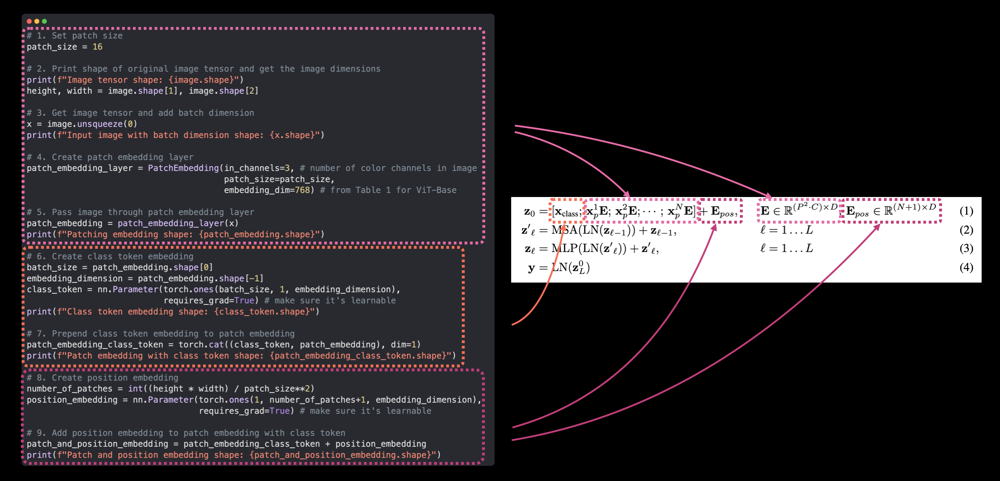

Mapping equation 1 from the ViT paper to our PyTorch code. This is the essence of paper replicating, taking a research paper and turning it into usable code.

Now we've got a way to encode our images and pass them to the Transformer Encoder in Figure 1 of the ViT paper.

Workflow
![gif](https://github.com/mrdbourke/pytorch-deep-learning/raw/main/images/08-vit-paper-architecture-animation-full-architecture.gif)

## 5. Equation 2: Multi-Head Attention (MSA)

Recall equation 2 states:

$$ \begin{aligned} \mathbf{z}_{\ell}^{\prime} &=\operatorname{MSA}\left(\operatorname{LN}\left(\mathbf{z}_{\ell-1}\right)\right)+\mathbf{z}_{\ell-1}, & & \ell=1 \ldots L \end{aligned} $$

This indicates a Multi-Head Attention (MSA) layer wrapped in a LayerNorm (LN) layer with a residual connection (the input to the layer gets added to the output of the layer).

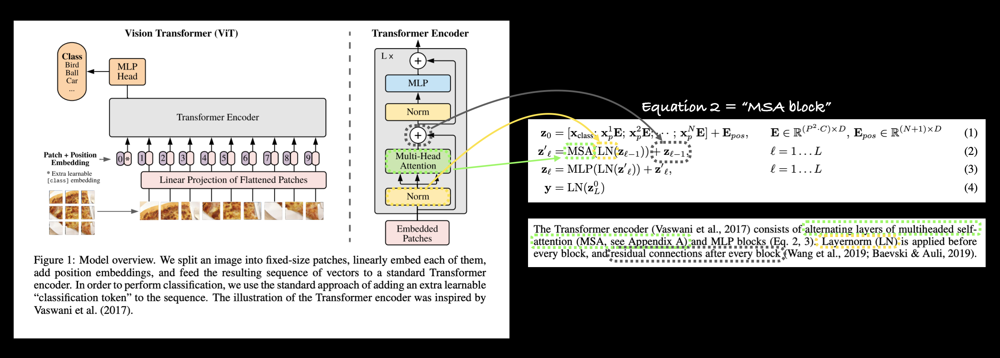


*    Multi-Head Self Attention (MSA) -`torch.nn.MultiheadAttention()`.
*    Norm (LN or LayerNorm) - `torch.nn.LayerNorm()`.
*    Residual connection - add the input to output (we'll see this later on when we create the full Transformer Encoder block in section 7.1).


### 5.1 The LayerNorm (LN) layer

Layer Normalization (`torch.nn.LayerNorm()` or Norm or LayerNorm or LN) normalizes an input over the last dimension.

used to make training faster.

### 5.2 The Multi-Head Self Attention (MSA) layer

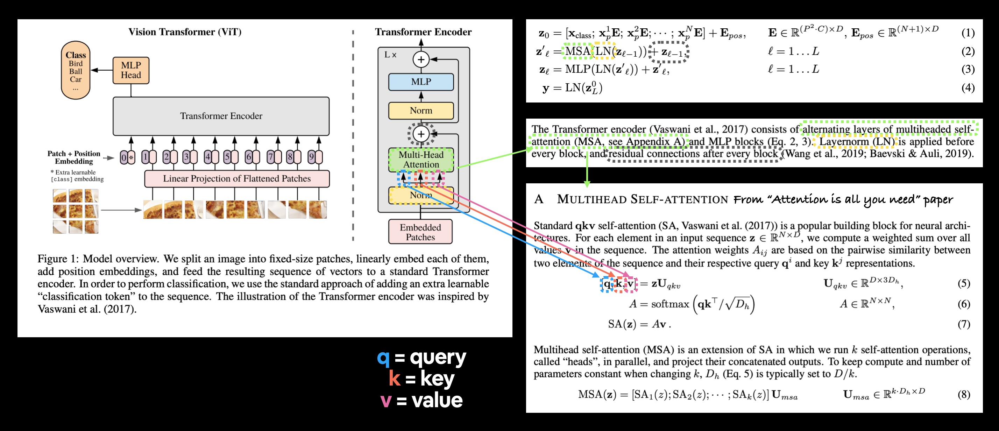

We can implement the MSA layer in PyTorch with `torch.nn.MultiheadAttention()` with the parameters:

*    embed_dim - the embedding dimension from Table 1 (Hidden size $D$).
*    num_heads - how many attention heads to use (this is where the term "multihead" comes from), this value is also in Table 1 (Heads).
*    dropout - whether or not to apply dropout to the attention layer (according to Appendix B.1, dropout isn't used after the qkv-projections).
*    batch_first - does our batch dimension come first? (yes it does)


### 5.3 Replicating Equation 2 With PyTorch layers

to do so, we'll:

1. Create a class called `MultiheadSelfAttentionBlock` that inherits from nn.module
2. initialize class with hyper params from table 1 of ViT paper for the base model
3. Layer normalization (LN) layer with `torch.nn.LayerNorm()` with the `normalized_shape` parameter the same as our embedding dimension
4. create a multi-head attention (MSA) layer with appropriate embed_dim, num_heads, dropout and batch_first parameters.
5. Create a `forward()` method for our class passing in the inputs through the LN layer and MSA layer.

In [34]:
class MultiheadSelfAttentionBlock(nn.Module):

    def __init__(self,
                 embedding_dim : int = 768, # hidden size d from table 1
                 num_heads: int = 12, # heads from table 1
                 attn_dropout:float = 0): # paper does not use any
        super().__init__()

        # create norm layer
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)

        # create multi-head attention layer
        self.multihead_attn = nn.MultiheadAttention(embed_dim= embedding_dim,
                                                    num_heads= num_heads,
                                                    dropout= attn_dropout,
                                                    batch_first= True)
        
    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query = x,
                                             key = x,
                                             value = x,
                                             need_weights = False)
        
        return attn_output


lets try it out

In [35]:
# Create an instance of MSABlock
multihead_self_attention_block = MultiheadSelfAttentionBlock(embedding_dim=768, # from Table 1
                                                             num_heads=12) # from Table 1

# Pass patch and position image embedding through MSABlock
patched_image_through_msa_block = multihead_self_attention_block(patch_and_position_embedding)
print(f"Input shape of MSA block: {patch_and_position_embedding.shape}")
print(f"Output shape MSA block: {patched_image_through_msa_block.shape}")

Input shape of MSA block: torch.Size([1, 197, 768])
Output shape MSA block: torch.Size([1, 197, 768])


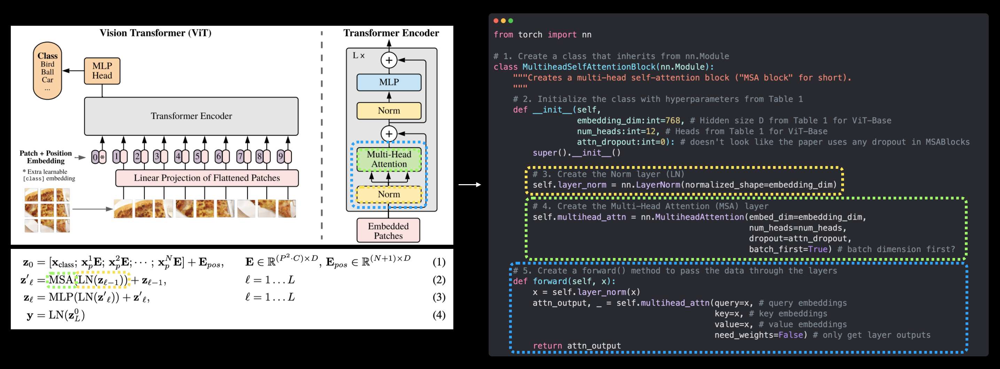

## 6. Equation 3: Multilayer Perceptron (MLP)

replicate equation 3:

$$ \begin{aligned} \mathbf{z}_{\ell} &=\operatorname{MLP}\left(\operatorname{LN}\left(\mathbf{z}_{\ell}^{\prime}\right)\right)+\mathbf{z}_{\ell}^{\prime}, & & \ell=1 \ldots L \end{aligned} $$

Here MLP stands for "multilayer perceptron" and LN stands for "layer normalization" (as discussed above).

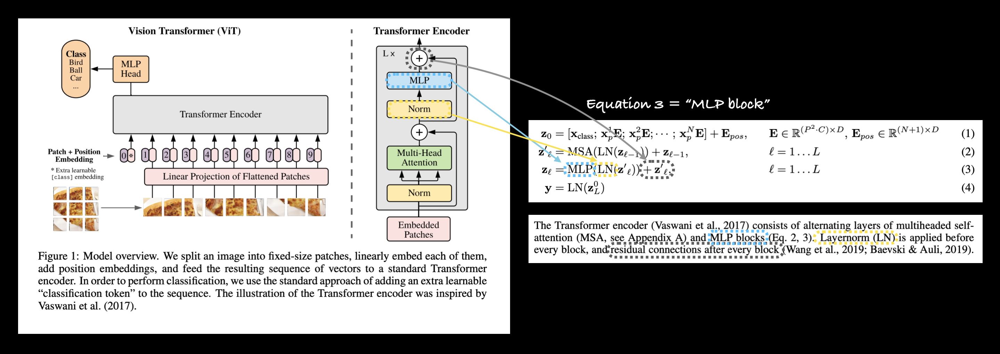

### 6.1 The MLP layer(s)

this generaly means multiple layers 

in ViT paper the MLP structure is:
`2 layers with GELU non-linearity`

`torch.nn.Linear()` and `torch.nn.GELU`

dropout is applied after every dense layer (linear layer) except the qkv projections and directly after adding positional to patch embedding.

the structure is:
`layer norm -> linear layer -> non-linear layer -> dropout -> linear layer -> dropout

with hyper params from the table 1`

### 6.2 Replicating equation 3 with PyTorch layers

1. Create a class MLPBlock that inherit nn.Module
2. Initialize class with hyperparams of the ViT paper for the ViT base model.
3. create layer normalization with `torch.nn.LayerNorm()` with normalized_shape parameter the same as our embedding dimension
4. Create a sequential series of MLP layers with structure and appropriate hyper params
5. create a forward() method for our class passing in the inputs through LN and MLP layers

In [36]:
class MLPBlock(nn.Module):

    def __init__(self,
                 embedding_dim: int = 768,
                 mlp_size: int = 3072,
                 dropout: float = 0.1):
        super().__init__()

        # make layer norm
        self.layer_norm = nn.LayerNorm(normalized_shape= embedding_dim)

        # make mlp block 
        self.mlp = nn.Sequential(
            nn.Linear(in_features= embedding_dim,
                      out_features= mlp_size),
                      nn.GELU(),
                      nn.Dropout(p = dropout),
                      nn.Linear(in_features= mlp_size,
                                out_features= embedding_dim),
                      nn.Dropout(p = dropout)
        )

    def forward(self, x):
        # x = self.layer_norm(x)
        # x = self.mlp(x)

        # return x
    
        return self.mlp(self.layer_norm(x))


lets try

In [37]:
# Create an instance of MLPBlock
mlp_block = MLPBlock(embedding_dim=768, # from Table 1
                     mlp_size=3072, # from Table 1
                     dropout=0.1) # from Table 3

# Pass output of MSABlock through MLPBlock
patched_image_through_mlp_block = mlp_block(patched_image_through_msa_block)
print(f"Input shape of MLP block: {patched_image_through_msa_block.shape}")
print(f"Output shape MLP block: {patched_image_through_mlp_block.shape}")

Input shape of MLP block: torch.Size([1, 197, 768])
Output shape MLP block: torch.Size([1, 197, 768])


## 7. Create the transformer encoder

The transformer encoder will encode our patched image embedding into a learned representation using a series of alternating layers of MSA blocks and MLP blocks as per section 3.1 of the ViT paper:

* Residual Connection: means the input of the MSA block is added back to the output of the MSA before passing to the MLP block.
(in code: `x_input -> MSA_block -> [MSA_block_output + x_input] -> MLP_block -> [MLP_block_output + MSA_block_output + x_input] -> ...`

**umm, but use? what does this do?**
- this helps weight values and gradient from being too small which can result in vanishing gradient problem.




### 7.1 Creating a transformer Encoder by combining our custom made layers

to achieve this we follow the following steps:

1. Create a class `TransformerEndcoderBlock`.
2. Initialize the hyper params from table 1 and 3 of the paper
3. Instantiate a MSA block for eq2 using our `MultiheadSelfAttentionBlock`
4. Instantiate a MLP block for eq3 using our `MLPBlock`
5. Create a forward method for our class.
6. Create residual connection for MSA block (eq2)
7. Create a residual connection for MLP block (eq3)

In [38]:
# step 1
class TransformerEncoderBlock(nn.Module):
    # step 2
    def __init__(self,
                 embedding_dim = 768, # Hidden size D from Table 1
                 num_heads:int = 12, # heads from Table 1
                 mlp_size:int = 3072, # MLP size from table 1 of ViT-Base
                 mlp_dropout:float = 0.1, # amt of dropout for dense layers from table 3
                 attn_dropout:float = 0 # amt of dropout for attention layers

    ):
        super().__init__()
        # step 3

        self.MSA_block = MultiheadSelfAttentionBlock(embedding_dim= embedding_dim,
                                                     num_heads= num_heads,
                                                     attn_dropout=attn_dropout)
        #step 4

        self.MLP_block = MLPBlock(embedding_dim=embedding_dim,
                                  mlp_size=mlp_size,
                                  dropout=mlp_dropout)

    
    def forward(self,x):

        # 6. residual conn MSA

        x = self.MSA_block(x) + x

        # 7. residual conn MLP

        x = self.MLP_block(x) + x

        return x        

    

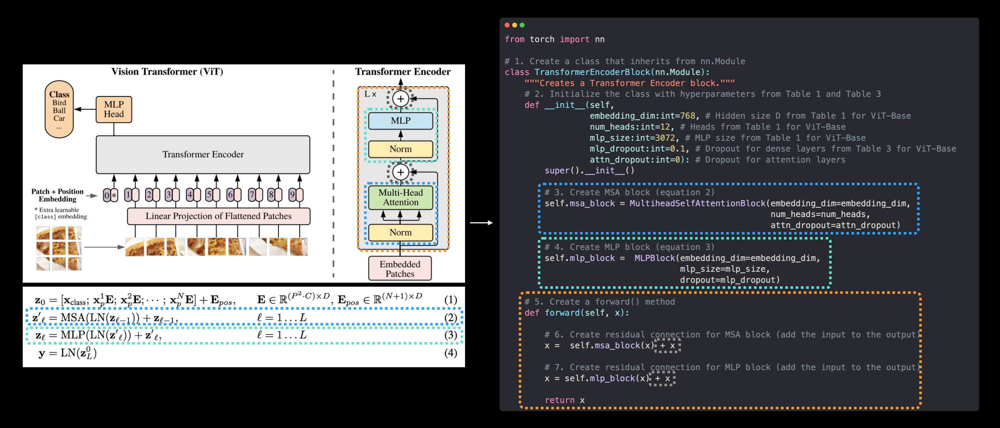

In [39]:
# summary of block

transformer_encoder_block = TransformerEncoderBlock()

summary(transformer_encoder_block, 
        (1,197,768),
        col_names=["input_size","output_size","num_params","trainable"],
        col_width = 20,
        row_settings = ["var_names"])

c:\Users\Anubhav\miniconda3\envs\nn\lib\site-packages\torch\nn\modules\activation.py:1230: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  return torch._native_multi_head_attention(


Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderBlock (TransformerEncoderBlock)  [1, 197, 768]        [1, 197, 768]        --                   True
├─MultiheadSelfAttentionBlock (MSA_block)          [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─MultiheadAttention (multihead_attn)         --                   [1, 197, 768]        2,362,368            True
├─MLPBlock (MLP_block)                             [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─Sequential (mlp)                            [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─Linear (0)                     

### 7.2 Creating a Transformer Encoder with PyTorch's Transformer layers

Now that we know how to build it, we can make our work easy by next time using PyTorch's in-built Transformer layers as part of torch.nn


In [40]:
torch_transformer_encoder_layer = nn.TransformerEncoderLayer(d_model = 768,
                                                             nhead = 12,
                                                             dim_feedforward=3072,
                                                             dropout=0.1,
                                                             activation="gelu",
                                                             batch_first=True,
                                                             norm_first= True
                                                             )

torch_transformer_encoder_layer

TransformerEncoderLayer(
  (self_attn): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
  )
  (linear1): Linear(in_features=768, out_features=3072, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (linear2): Linear(in_features=3072, out_features=768, bias=True)
  (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  (dropout1): Dropout(p=0.1, inplace=False)
  (dropout2): Dropout(p=0.1, inplace=False)
)

In [41]:
summary(torch_transformer_encoder_layer, 
        (1,197,768),
        col_names=["input_size","output_size","num_params","trainable"],
        col_width = 20,
        row_settings = ["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderLayer (TransformerEncoderLayer)  [1, 197, 768]        [1, 197, 768]        7,087,872            True
Total params: 7,087,872
Trainable params: 7,087,872
Non-trainable params: 0
Total mult-adds (M): 0
Input size (MB): 0.61
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.61

Benefits of using PyTorch's pre-built layers


- **Less prone to errors** - Generally, if a layer makes it into the PyTorch standard library, it's been tested and tried to work.
- **Potentially better performance** - As of July 2022 and PyTorch 1.12, the PyTorch implemented version of torch.nn.TransformerEncoderLayer() can see a speedup of more than 2x on many common workloads.

Since we stack multiple transformer onto each other 

we can do this by- `torch.nn.TransformerEncoder(encoder_layer, numlayers)` where:

* encoder_layer - The target layer we wanna duplicate 
* numlayers - no of layers you want



 ## 8. Putting everything together for ViT

 to bring our own implementation of ViT to life, let's:

1. Create a class called ViT that inherits from torch.nn.Module.
2. Initialize the class with hyperparameters from Table 1 and Table 3 of the ViT paper for the ViT-Base model.
3. Make sure the image size is divisible by the patch size (the image should be split into even patches).
4. Calculate the number of patches using the formula $N=H W / P^{2}$, where $H$ is the image height, $W$ is the image width and $P$ is the patch size.
5. Create a learnable class embedding token (equation 1) as done above in section 4.6.
6.Create a learnable position embedding vector (equation 1) as done above in section 4.7.
7.  Setup the embedding dropout layer as discussed in Appendix B.1 of the ViT paper.
8.  Create the patch embedding layer using the PatchEmbedding class as above in section 4.5.
9. Create a series of Transformer Encoder blocks by passing a list of TransformerEncoderBlocks created in section 7.1 to torch.nn.Sequential() (equations 2 & 3).
10. Create the MLP head (also called classifier head or equation 4) by passing a torch.nn.LayerNorm() (LN) layer and a torch.nn.Linear(out_features=num_classes) layer (num_classes is the target number of classes) linear layer to torch.nn.Sequential().
11. Create a forward() method that accepts an input.
12. Get the batch size of the input (the first dimension of the shape).
13. Create the patching embedding using the layer created in step 8 (equation 1).
14. Create the class token embedding using the layer created in step 5 and expand it across the number of batches found in step 11 using torch.Tensor.expand() (equation 1).
15. Concatenate the class token embedding created in step 13 to the first dimension of the patch embedding created in step 12 using torch.cat() (equation 1).
16. Add the position embedding created in step 6 to the patch and class token embedding created in step 14 (equation 1).
17. Pass the patch and position embedding through the dropout layer created in step 7.
18. Pass the patch and position embedding from step 16 through the stack of Transformer Encoder layers created in step 9 (equations 2 & 3).
19. Pass index 0 of the output of the stack of Transformer Encoder layers from step 17 through the classifier head created in step 10 (equation 4).
    

In [42]:
# 1. Create a ViT class that inherits from nn.Module
class ViT(nn.Module):
    """Creates a Vision Transformer architecture with ViT-Base hyperparameters by default."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 img_size:int=224, # Training resolution from Table 3 in ViT paper
                 in_channels:int=3, # Number of channels in input image
                 patch_size:int=16, # Patch size
                 num_transformer_layers:int=12, # Layers from Table 1 for ViT-Base
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 attn_dropout:float=0, # Dropout for attention projection
                 mlp_dropout:float=0.1, # Dropout for dense/MLP layers
                 embedding_dropout:float=0.1, # Dropout for patch and position embeddings
                 num_classes:int=1000): # Default for ImageNet but can customize this
        super().__init__() # don't forget the super().__init__()!

        # 3. Make the image size is divisible by the patch size
        assert img_size % patch_size == 0, f"Image size must be divisible by patch size, image size: {img_size}, patch size: {patch_size}."

        # 4. Calculate number of patches (height * width/patch^2)
        self.num_patches = (img_size * img_size) // patch_size**2

        # 5. Create learnable class embedding (needs to go at front of sequence of patch embeddings)
        self.class_embedding = nn.Parameter(data=torch.randn(1, 1, embedding_dim),
                                            requires_grad=True)

        # 6. Create learnable position embedding
        self.position_embedding = nn.Parameter(data=torch.randn(1, self.num_patches+1, embedding_dim),
                                               requires_grad=True)

        # 7. Create embedding dropout value
        self.embedding_dropout = nn.Dropout(p=embedding_dropout)

        # 8. Create patch embedding layer
        self.patch_embedding = PatchEmbedding(in_channels=in_channels,
                                              patch_size=patch_size,
                                              embedding_dim=embedding_dim)

        # 9. Create Transformer Encoder blocks (we can stack Transformer Encoder blocks using nn.Sequential())
        # Note: The "*" means "all"
        self.transformer_encoder = nn.Sequential(*[TransformerEncoderBlock(embedding_dim=embedding_dim,
                                                                            num_heads=num_heads,
                                                                            mlp_size=mlp_size,
                                                                            mlp_dropout=mlp_dropout) for _ in range(num_transformer_layers)])

        # 10. Create classifier head
        self.classifier = nn.Sequential(
            nn.LayerNorm(normalized_shape=embedding_dim),
            nn.Linear(in_features=embedding_dim,
                      out_features=num_classes)
        )

    # 11. Create a forward() method
    def forward(self, x):

        # 12. Get batch size
        batch_size = x.shape[0]

        # 13. Create class token embedding and expand it to match the batch size (equation 1)
        class_token = self.class_embedding.expand(batch_size, -1, -1) # "-1" means to infer the dimension (try this line on its own)

        # 14. Create patch embedding (equation 1)
        x = self.patch_embedding(x)

        # 15. Concat class embedding and patch embedding (equation 1)
        x = torch.cat((class_token, x), dim=1)

        # 16. Add position embedding to patch embedding (equation 1)
        x = self.position_embedding + x

        # 17. Run embedding dropout (Appendix B.1)
        x = self.embedding_dropout(x)

        # 18. Pass patch, position and class embedding through transformer encoder layers (equations 2 & 3)
        x = self.transformer_encoder(x)

        # 19. Put 0 index logit through classifier (equation 4)
        x = self.classifier(x[:, 0]) # run on each sample in a batch at 0 index

        return x

In [43]:
# lets do a prediction
set_seeds()

# Create a random tensor with same shape as a single image
random_image_tensor = torch.randn(1, 3, 224, 224) # (batch_size, color_channels, height, width)

# Create an instance of ViT with the number of classes we're working with (pizza, steak, sushi)
vit = ViT(num_classes=len(class_names))

# Pass the random image tensor to our ViT instance
vit(random_image_tensor)

tensor([[-0.2377,  0.7360,  1.2137]], grad_fn=<AddmmBackward0>)

### 8.1 Summary of model


In [44]:
from torchinfo import summary

# # Print a summary of our custom ViT model using torchinfo (uncomment for actual output)
summary(model=vit,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
ViT (ViT)                                                    [32, 3, 224, 224]    [32, 3]              152,064              True
├─PatchEmbedding (patch_embedding)                           [32, 3, 224, 224]    [32, 196, 768]       --                   True
│    └─Conv2d (patcher)                                      [32, 3, 224, 224]    [32, 768, 14, 14]    590,592              True
│    └─Flatten (flatten)                                     [32, 768, 14, 14]    [32, 768, 196]       --                   --
├─Dropout (embedding_dropout)                                [32, 197, 768]       [32, 197, 768]       --                   --
├─Sequential (transformer_encoder)                           [32, 197, 768]       [32, 197, 768]       --                   True
│    └─TransformerEncoderBlock (0)                           [32, 197, 768]       [32, 197, 768]

85M parameters 

The number is very close to PyTorch's pretrained ViT-Base with patch size 16 at torch.vision.models.vit_b_16() with 86,567,656 total parameters (though this number of parameters is for the 1000 classes in ImageNet).

## 9. Setting up the training code


In [46]:
from going_modular.going_modular import engine

# Setup the optimizer to optimize our ViT model parameters using hyperparameters from the ViT paper
optimizer = torch.optim.Adam(params=vit.parameters(),
                             lr=3e-3, # Base LR from Table 3 for ViT-* ImageNet-1k
                             betas=(0.9, 0.999), # default values but also mentioned in ViT paper section 4.1 (Training & Fine-tuning)
                             weight_decay=0.3) # from the ViT paper section 4.1 (Training & Fine-tuning) and Table 3 for ViT-* ImageNet-1k

# Setup the loss function for multi-class classification
loss_fn = torch.nn.CrossEntropyLoss()

# Set the seeds
set_seeds()

# Train the model and save the training results to a dictionary
results = engine.train(model=vit,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=10,
                       device=device)

 10%|█         | 1/10 [01:06<09:58, 66.53s/it]

Epoch: 1 | train_loss: 5.1600 | train_acc: 0.3555 | test_loss: 5.0876 | test_acc: 0.2604


 20%|██        | 2/10 [02:15<09:01, 67.72s/it]

Epoch: 2 | train_loss: 1.8958 | train_acc: 0.3477 | test_loss: 1.8803 | test_acc: 0.2604


 30%|███       | 3/10 [03:18<07:41, 65.90s/it]

Epoch: 3 | train_loss: 1.2435 | train_acc: 0.4570 | test_loss: 1.7588 | test_acc: 0.2604


 40%|████      | 4/10 [04:27<06:42, 67.03s/it]

Epoch: 4 | train_loss: 1.2817 | train_acc: 0.2695 | test_loss: 1.3184 | test_acc: 0.1979


 50%|█████     | 5/10 [05:37<05:39, 67.92s/it]

Epoch: 5 | train_loss: 1.1503 | train_acc: 0.2812 | test_loss: 1.2365 | test_acc: 0.2604


 60%|██████    | 6/10 [06:46<04:34, 68.59s/it]

Epoch: 6 | train_loss: 1.1964 | train_acc: 0.3047 | test_loss: 1.2351 | test_acc: 0.1979


 70%|███████   | 7/10 [07:55<03:25, 68.51s/it]

Epoch: 7 | train_loss: 1.2646 | train_acc: 0.2695 | test_loss: 1.1801 | test_acc: 0.1979


 80%|████████  | 8/10 [09:02<02:15, 67.95s/it]

Epoch: 8 | train_loss: 1.1065 | train_acc: 0.2930 | test_loss: 1.1730 | test_acc: 0.2604


 90%|█████████ | 9/10 [10:07<01:07, 67.19s/it]

Epoch: 9 | train_loss: 1.1435 | train_acc: 0.3047 | test_loss: 1.0147 | test_acc: 0.5417


100%|██████████| 10/10 [11:14<00:00, 67.41s/it]

Epoch: 10 | train_loss: 1.2519 | train_acc: 0.2617 | test_loss: 1.3860 | test_acc: 0.2604


### 9.1 What our training loop is missing
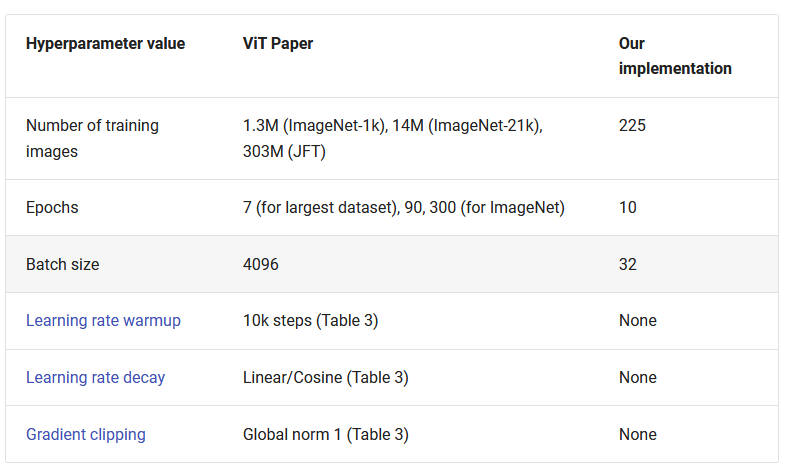

Even though our ViT architecture is the same as the paper, the results from the ViT paper were achieved using far more data and a more elaborate training scheme than ours.

Because of the size of the ViT architecture and its high number of parameters (increased learning capabilities), and amount of data it uses (increased learning opportunities), many of the techniques used in the ViT paper training scheme such as learning rate warmup, learning rate decay and gradient clipping are specifically designed to prevent overfitting (regularization).

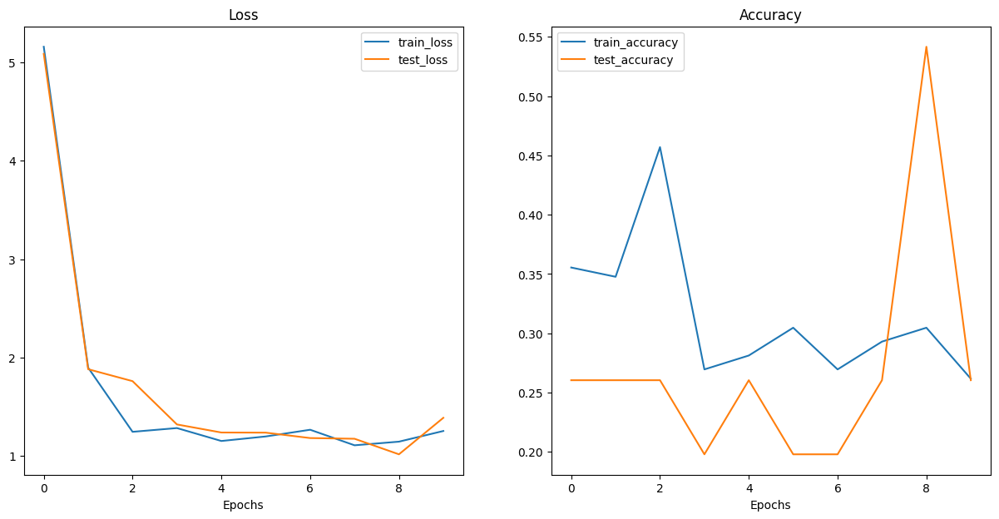

In [47]:
from helper_functions import plot_loss_curves

# Plot our ViT model's loss curves
plot_loss_curves(results)

## 10. using pre-trained model

We observe there there is severe underfitting of the model

fixing this needs us more data, and then trainign it would take sooo long so lets shift to pre-trained model

In [48]:
# 1. Get pretrained weights for ViT-Base
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT # requires torchvision >= 0.13, "DEFAULT" means best available

# 2. Setup a ViT model instance with pretrained weights
pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

# 3. Freeze the base parameters
for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False

# 4. Change the classifier head (set the seeds to ensure same initialization with linear head)
set_seeds()
pretrained_vit.heads = nn.Linear(in_features=768, out_features=len(class_names)).to(device)
# pretrained_vit # uncomment for model output

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to C:\Users\Anubhav/.cache\torch\hub\checkpoints\vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:18<00:00, 19.0MB/s] 


In [50]:
# # Print a summary using torchinfo (uncomment for actual output)
summary(model=pretrained_vit,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]    [32, 3]              768                  Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 768, 14, 14]    (590,592)            False
├─Encoder (encoder)                                          [32, 197, 768]       [32, 197, 768]       151,296              False
│    └─Dropout (dropout)                                     [32, 197, 768]       [32, 197, 768]       --                   --
│    └─Sequential (layers)                                   [32, 197, 768]       [32, 197, 768]       --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]       [32, 197, 768]       (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [32, 197, 768]       [32, 

In [52]:
### 10.1 Preparing data 
# Setup train and test directory paths
from helper_functions import download_data

# Download pizza, steak, sushi images from GitHub
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

train_dir = image_path / "train"
test_dir = image_path / "test"
train_dir, test_dir

[INFO] data\pizza_steak_sushi directory exists, skipping download.


(WindowsPath('data/pizza_steak_sushi/train'),
 WindowsPath('data/pizza_steak_sushi/test'))

In [56]:
# Get automatic transforms from pretrained ViT weights
pretrained_vit_transforms = pretrained_vit_weights.transforms()
print(pretrained_vit_transforms)
# Setup dataloaders
train_dataloader_pretrained, test_dataloader_pretrained, class_names = data_setup.create_dataloaders(train_dir=train_dir,
                                                                                                     test_dir=test_dir,
                                                                                                     transform=pretrained_vit_transforms,
                                                                                                     batch_size=32) # Could increase if we had more samples, such as here: https://arxiv.org/abs/2205.01580 (there are other improvements there too...)


ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


### 10.2 Feature extractor

In [57]:
from going_modular.going_modular import engine

# Create optimizer and loss function
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(),
                             lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

# Train the classifier head of the pretrained ViT feature extractor model
set_seeds()
pretrained_vit_results = engine.train(model=pretrained_vit,
                                      train_dataloader=train_dataloader_pretrained,
                                      test_dataloader=test_dataloader_pretrained,
                                      optimizer=optimizer,
                                      loss_fn=loss_fn,
                                      epochs=10,
                                      device=device)

 10%|█         | 1/10 [00:09<01:26,  9.63s/it]

Epoch: 1 | train_loss: 0.7663 | train_acc: 0.7188 | test_loss: 0.5435 | test_acc: 0.8769


 20%|██        | 2/10 [00:19<01:16,  9.59s/it]

Epoch: 2 | train_loss: 0.3436 | train_acc: 0.9453 | test_loss: 0.3257 | test_acc: 0.8977


 30%|███       | 3/10 [00:28<01:07,  9.62s/it]

Epoch: 3 | train_loss: 0.2068 | train_acc: 0.9492 | test_loss: 0.2698 | test_acc: 0.9186


 40%|████      | 4/10 [00:38<00:57,  9.58s/it]

Epoch: 4 | train_loss: 0.1557 | train_acc: 0.9609 | test_loss: 0.2414 | test_acc: 0.9186


 50%|█████     | 5/10 [00:48<00:48,  9.74s/it]

Epoch: 5 | train_loss: 0.1244 | train_acc: 0.9727 | test_loss: 0.2271 | test_acc: 0.8977


 60%|██████    | 6/10 [00:58<00:39,  9.83s/it]

Epoch: 6 | train_loss: 0.1210 | train_acc: 0.9766 | test_loss: 0.2122 | test_acc: 0.9280


 70%|███████   | 7/10 [01:09<00:30, 10.09s/it]

Epoch: 7 | train_loss: 0.0933 | train_acc: 0.9766 | test_loss: 0.2342 | test_acc: 0.8883


 80%|████████  | 8/10 [01:19<00:20, 10.28s/it]

Epoch: 8 | train_loss: 0.0793 | train_acc: 0.9844 | test_loss: 0.2268 | test_acc: 0.9081


 90%|█████████ | 9/10 [01:30<00:10, 10.47s/it]

Epoch: 9 | train_loss: 0.1084 | train_acc: 0.9883 | test_loss: 0.2064 | test_acc: 0.9384


100%|██████████| 10/10 [01:41<00:00, 10.16s/it]

Epoch: 10 | train_loss: 0.0646 | train_acc: 0.9922 | test_loss: 0.1795 | test_acc: 0.9176


### 10. Plot feature extractor ViT model loss curves

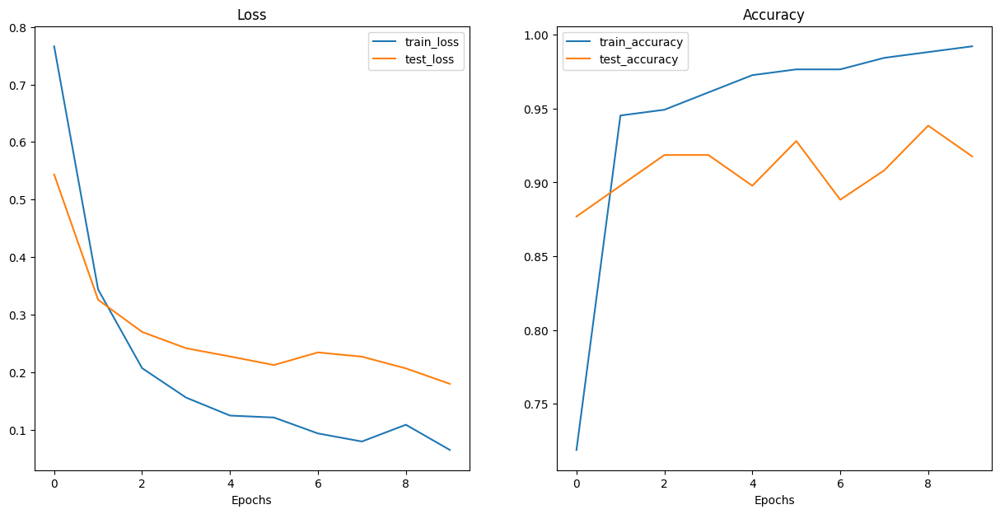

In [58]:
# Plot the loss curves
from helper_functions import plot_loss_curves

plot_loss_curves(pretrained_vit_results)

In [59]:
# Save the model
from going_modular.going_modular import utils

utils.save_model(model=pretrained_vit,
                 target_dir="models",
                 model_name="08_pretrained_vit_feature_extractor_pizza_steak_sushi.pth")

[INFO] Saving model to: models\08_pretrained_vit_feature_extractor_pizza_steak_sushi.pth


In [60]:
from pathlib import Path

# Get the model size in bytes then convert to megabytes
pretrained_vit_model_size = Path("models/08_pretrained_vit_feature_extractor_pizza_steak_sushi.pth").stat().st_size // (1024*1024) # division converts bytes to megabytes (roughly)
print(f"Pretrained ViT feature extractor model size: {pretrained_vit_model_size} MB")

Pretrained ViT feature extractor model size: 327 MB


## 11. Make predictions on a custom image

And finally, we'll finish with the ultimate test, predicting on our own custom data.

Let's download the pizza dad image (a photo of my dad eating pizza) and use our ViT feature extractor to predict on it

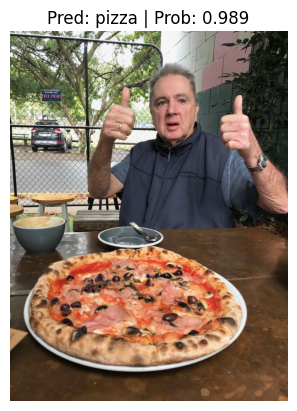

In [62]:
import requests

# Import function to make predictions on images and plot them
from going_modular.going_modular.predictions import pred_and_plot_image

# Setup custom image path
custom_image_path = image_path / "04-pizza-dad.jpeg"

# Download the image if it doesn't already exist
if not custom_image_path.is_file():
    with open(custom_image_path, "wb") as f:
        # When downloading from GitHub, need to use the "raw" file link
        request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
        print(f"Downloading {custom_image_path}...")
        f.write(request.content)
else:
    print(f"{custom_image_path} already exists, skipping download.")

# Predict on custom image
pred_and_plot_image(model=pretrained_vit,
                    image_path=custom_image_path,
                    class_names=class_names)